<a href="https://colab.research.google.com/github/edypj/DataPrediction/blob/main/MusicGenreClassificationAudioUnderstanding.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
from google.colab import files
import os
import pandas as pd
import librosa
import numpy as np
import matplotlib.pyplot as plt
import audioread
import soundfile as sf
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import BaggingClassifier
from imblearn.over_sampling import SMOTE
from joblib import dump
from joblib import load
import joblib


#combine CNN
from keras.applications import VGG16
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input
from keras.models import Model

from sklearn.preprocessing import LabelEncoder
from keras.preprocessing.image import load_img, img_to_array
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense



In [2]:
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
directory_path = '/content/drive/My Drive/dataset/AudioDataset/Data/genres_original'

# Fungsi untuk mencetak nama file dan folder di dalam suatu direktori
def print_files_and_folders_in_directory(directory):
    for item in os.listdir(directory):
        item_path = os.path.join(directory, item)
        if os.path.isfile(item_path):
            print("File:", item)
        elif os.path.isdir(item_path):
            print("Folder:", item)

# Memanggil fungsi untuk mencetak nama file dan folder di dalam direktori
print_files_and_folders_in_directory(directory_path)

Folder: blues
Folder: classical
Folder: jazz
Folder: pop


# Understanding Audio File

In [4]:
# Path ke direktori root Google Drive
general_path = '/content/drive/My Drive/dataset/AudioDataset/Data/genres_original'

# Fungsi untuk memproses setiap folder di dalam direktori
def process_folders(directory):
    for folder in os.listdir(directory):
        folder_path = os.path.join(directory, folder)
        if os.path.isdir(folder_path):
            print(f"Processing folder: {folder}")
            # Mencari semua file audio dalam folder
            audio_files = [file for file in os.listdir(folder_path) if file.endswith('.wav')]
            if audio_files:
                # Memilih satu file audio secara acak
                audio_file = np.random.choice(audio_files)
                file_path = os.path.join(folder_path, audio_file)
                # Memuat file audio menggunakan librosa
                y, sr = librosa.load(file_path)
                print('File:', audio_file)
                print('y:', y, '\n')
                print('y shape:', np.shape(y), '\n')
                print('Sample Rate (KHz):', sr, '\n')
                # Menghentikan setelah menampilkan satu file audio dari setiap folder


# Memanggil fungsi untuk memproses setiap folder
process_folders(general_path)

Processing folder: blues
File: blues.00088.wav
y: [-0.00299072  0.00485229  0.00845337 ... -0.06799316 -0.09191895
 -0.0987854 ] 

y shape: (661794,) 

Sample Rate (KHz): 22050 

Processing folder: classical
File: classical.00084.wav
y: [-0.03964233 -0.03643799 -0.03091431 ... -0.03707886 -0.015625
  0.01159668] 

y shape: (661794,) 

Sample Rate (KHz): 22050 

Processing folder: jazz
File: jazz.00013.wav
y: [0.02557373 0.04382324 0.03601074 ... 0.08731079 0.11334229 0.12271118] 

y shape: (661794,) 

Sample Rate (KHz): 22050 

Processing folder: pop
File: pop.00086.wav
y: [-0.02709961 -0.02371216  0.05221558 ... -0.15200806 -0.16900635
 -0.25219727] 

y shape: (661504,) 

Sample Rate (KHz): 22050 



# Representasi 2 Dimensi Audio File Secara Acak

Processing folder: blues


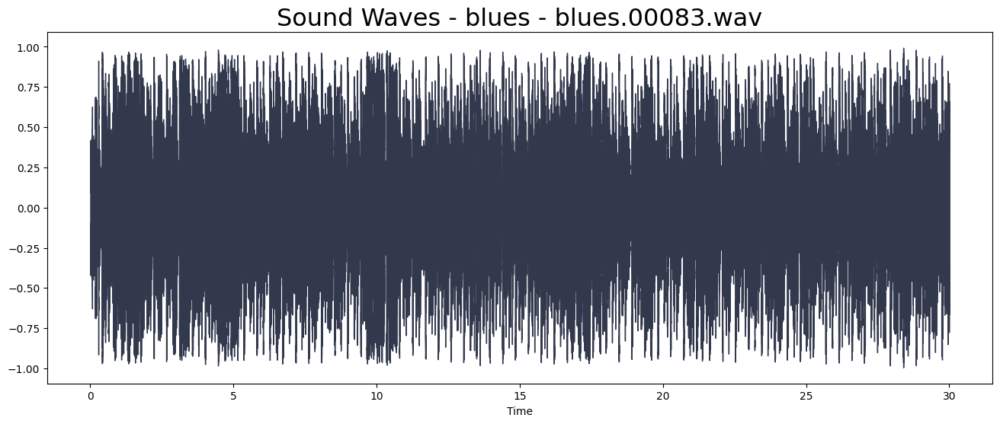

Processing folder: classical


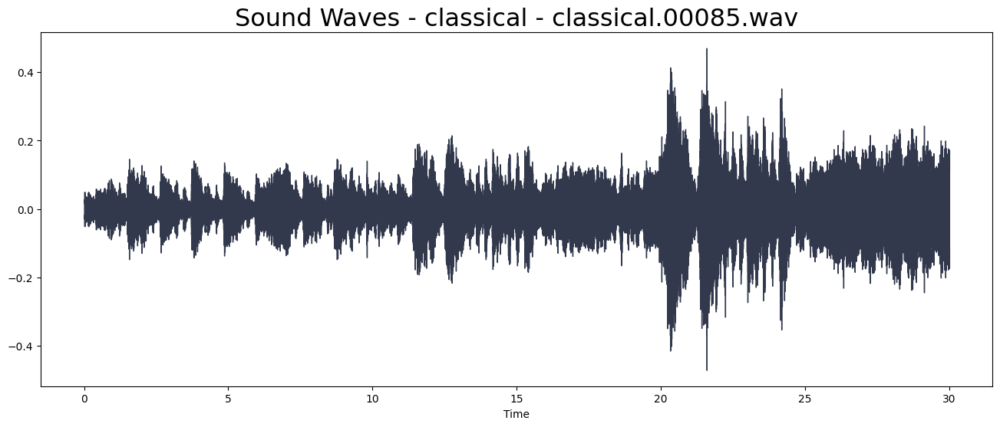

Processing folder: jazz


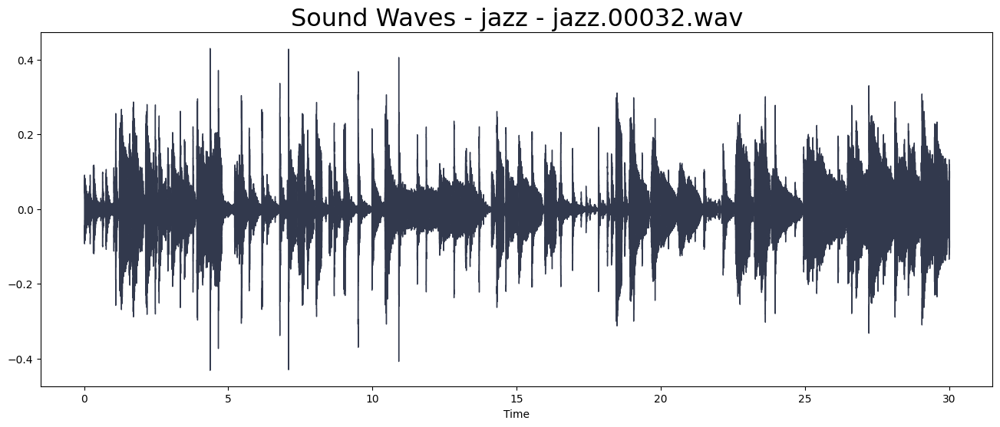

Processing folder: pop


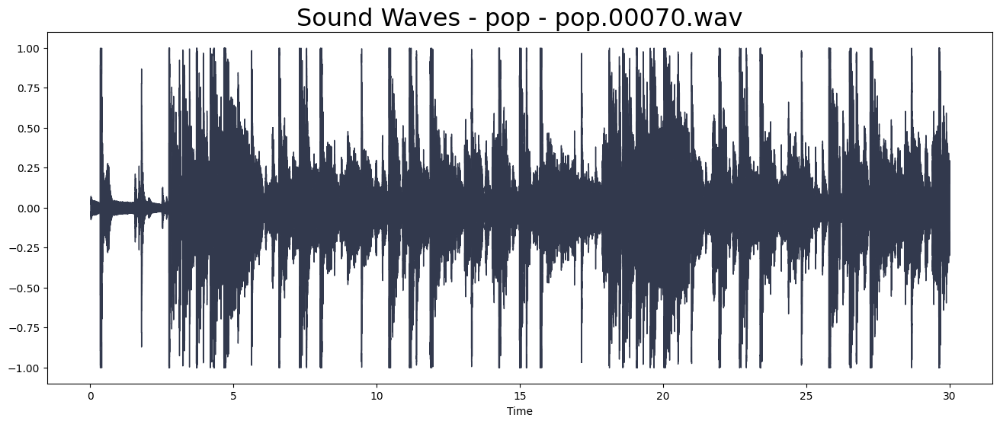

In [5]:
# Fungsi untuk memuat dan menampilkan gambar gelombang suara dari satu file audio di setiap genre
def process_folders(directory):
    for folder in os.listdir(directory):
        folder_path = os.path.join(directory, folder)
        if os.path.isdir(folder_path):
            print(f"Processing folder: {folder}")
            # Mencari semua file audio dalam folder
            audio_files = [file for file in os.listdir(folder_path) if file.endswith('.wav')]
            if audio_files:
                # Memilih satu file audio secara acak
                audio_file = np.random.choice(audio_files)
                file_path = os.path.join(folder_path, audio_file)
                # Memuat file audio menggunakan librosa
                y, sr = librosa.load(file_path)
                plt.figure(figsize=(16, 6))
                librosa.display.waveshow(y=y, sr=sr, color="#32394D")
                plt.title(f"Sound Waves - {folder} - {audio_file}", fontsize=23)
                plt.show()
                # Menghentikan setelah menampilkan satu file audio dari setiap genre
                #break

# Memanggil fungsi untuk memuat dan menampilkan gambar gelombang suara dari satu file audio di setiap genre
process_folders(general_path)

# Fourier Transform

Processing folder: blues


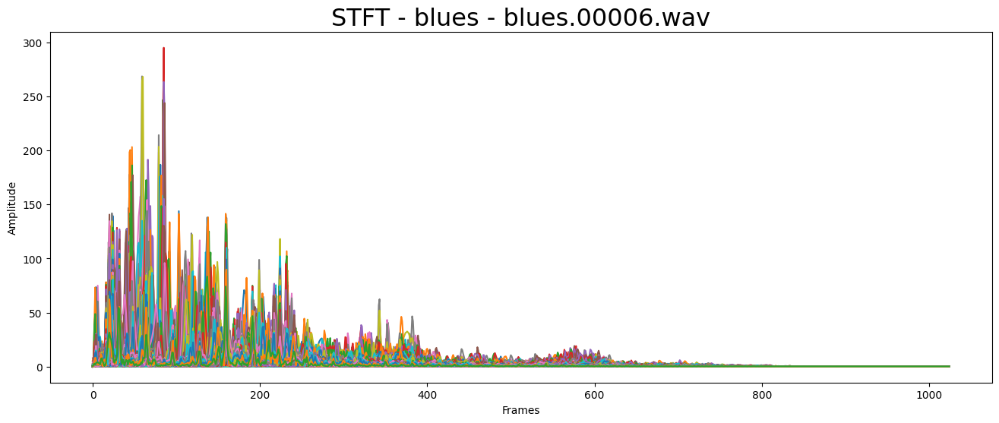

Processing folder: classical


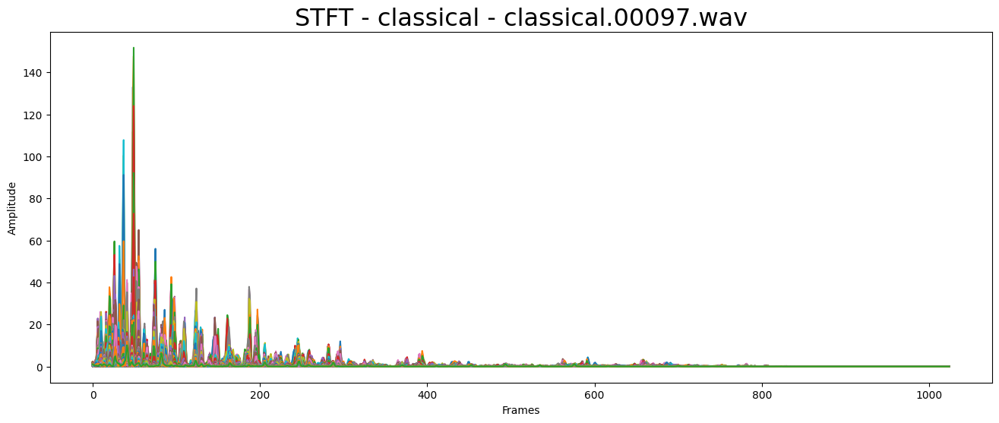

Processing folder: jazz


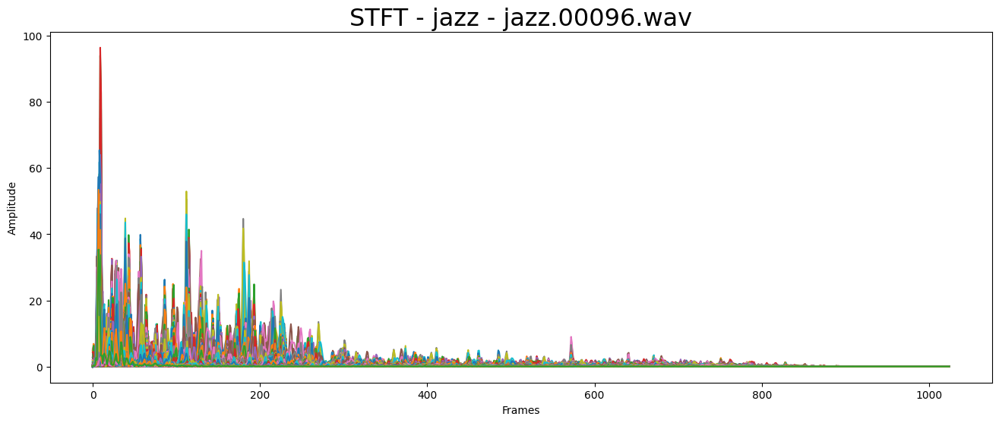

Processing folder: pop


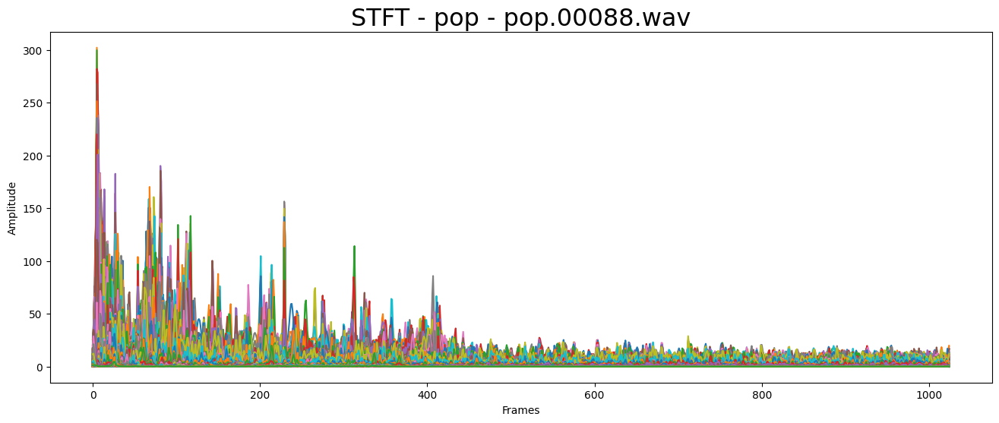

In [6]:
# Default FFT window size
n_fft = 2048  # Ukuran jendela FFT
hop_length = 512  # Jumlah frame audio antara kolom STFT (biasanya menjadi nilai default yang baik)

# Fungsi untuk memproses setiap folder di dalam direktori
def process_folders(directory):
    for folder in os.listdir(directory):
        folder_path = os.path.join(directory, folder)
        if os.path.isdir(folder_path):
            print(f"Processing folder: {folder}")
            # Mencari semua file audio dalam folder
            audio_files = [file for file in os.listdir(folder_path) if file.endswith('.wav')]
            if audio_files:
                # Memilih satu file audio secara acak
                audio_file = np.random.choice(audio_files)
                file_path = os.path.join(folder_path, audio_file)
                # Memuat file audio menggunakan librosa
                y, sr = librosa.load(file_path)
                # Melakukan Short-time Fourier transform (STFT)
                D = np.abs(librosa.stft(y, n_fft=n_fft, hop_length=hop_length))
                # Plot hasil STFT
                plt.figure(figsize=(16, 6))
                plt.plot(D)
                plt.title(f"STFT - {folder} - {audio_file}", fontsize=23)
                plt.xlabel('Frames')
                plt.ylabel('Amplitude')
                plt.show()
                # Menghentikan setelah memproses satu file audio dari setiap genre
                # break

# Memanggil fungsi untuk memproses setiap folder
process_folders(general_path)

# Spectogram

Processing folder: blues


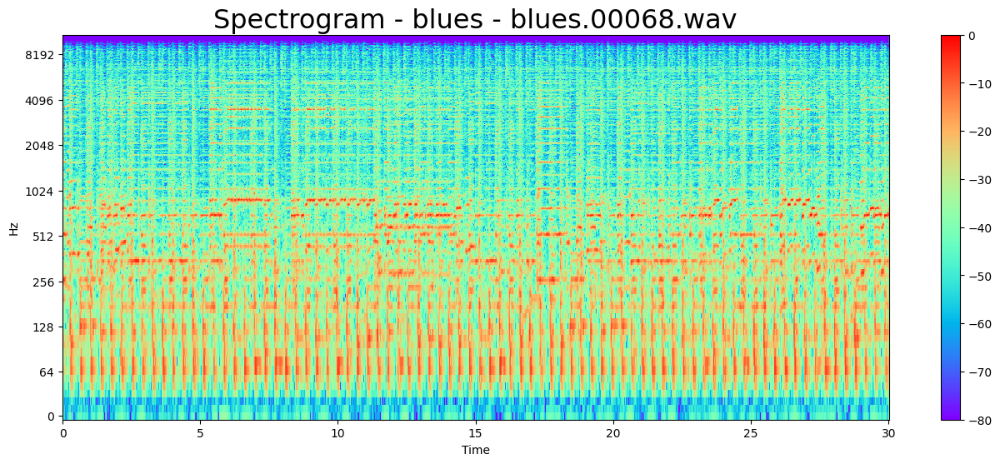

Processing folder: classical


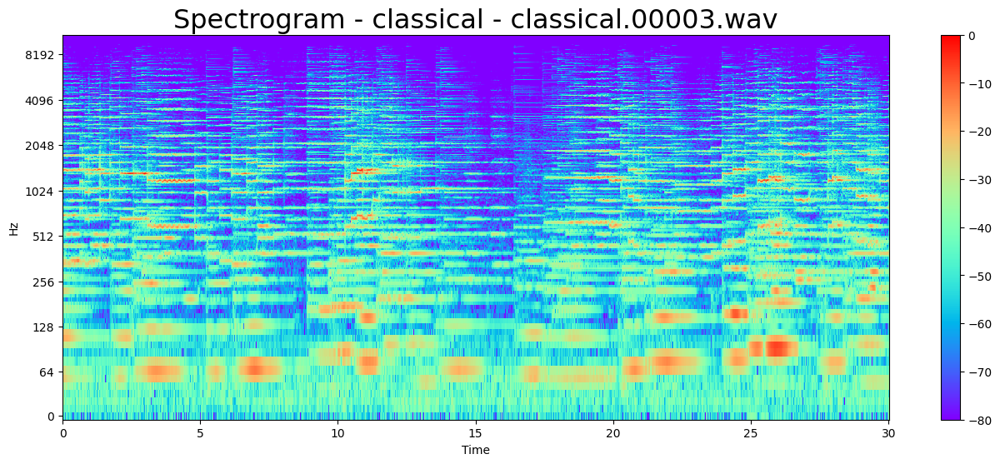

Processing folder: jazz


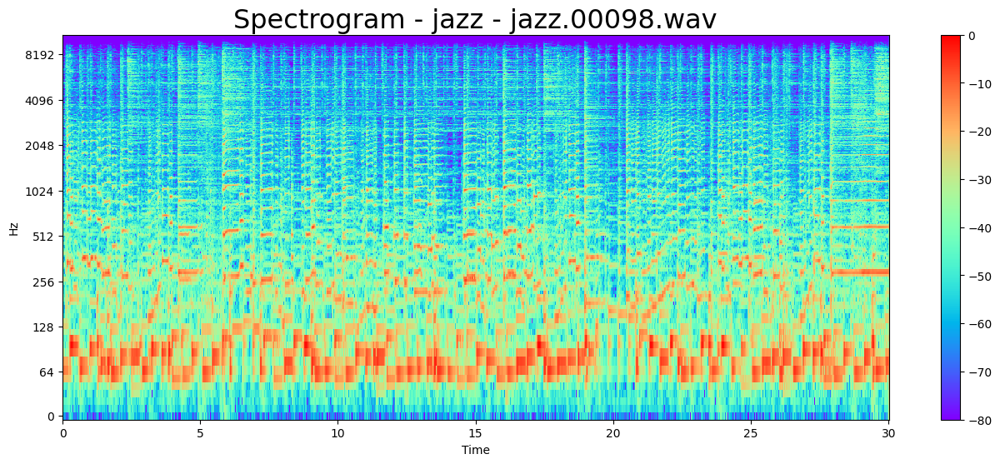

Processing folder: pop


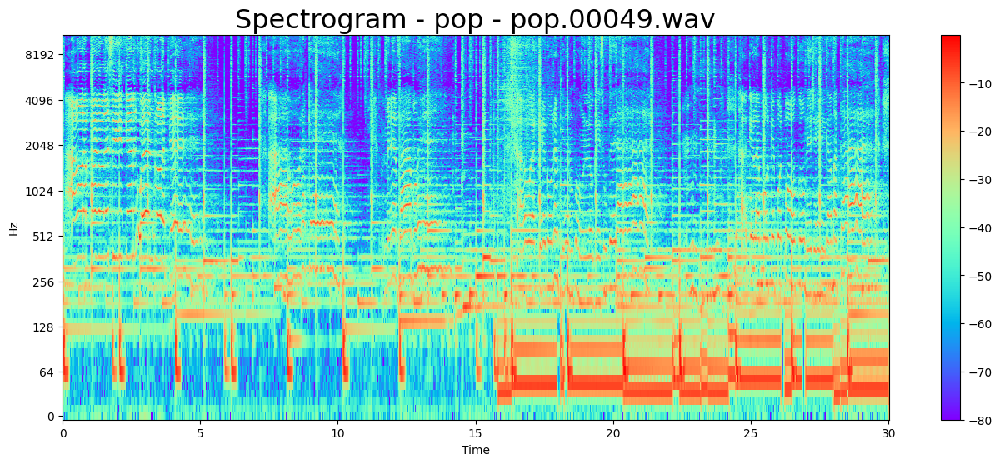

In [7]:
# Fungsi untuk memproses setiap folder di dalam direktori
def Spectogram (directory):
    for folder in os.listdir(directory):
        folder_path = os.path.join(directory, folder)
        if os.path.isdir(folder_path):
            print(f"Processing folder: {folder}")
            # Mencari semua file audio dalam folder
            audio_files = [file for file in os.listdir(folder_path) if file.endswith('.wav')]
            if audio_files:
                # Memilih satu file audio secara acak
                audio_file = np.random.choice(audio_files)
                file_path = os.path.join(folder_path, audio_file)
                # Memuat file audio menggunakan librosa
                y, sr = librosa.load(file_path)
                # Melakukan Short-time Fourier transform (STFT)
                D = np.abs(librosa.stft(y, n_fft=n_fft, hop_length=hop_length))
                # Konversi spektrogram amplitudo ke skala Desibel
                DB = librosa.amplitude_to_db(D, ref=np.max)
                # Membuat visualisasi spektrogram
                plt.figure(figsize=(16, 6))
                librosa.display.specshow(DB, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', cmap='rainbow')
                plt.colorbar()
                plt.title(f"Spectrogram - {folder} - {audio_file}", fontsize=23)
                plt.show()
                # Menghentikan setelah memproses satu file audio dari setiap genre
                # break

# Memanggil fungsi untuk memproses setiap folder
Spectogram (general_path)

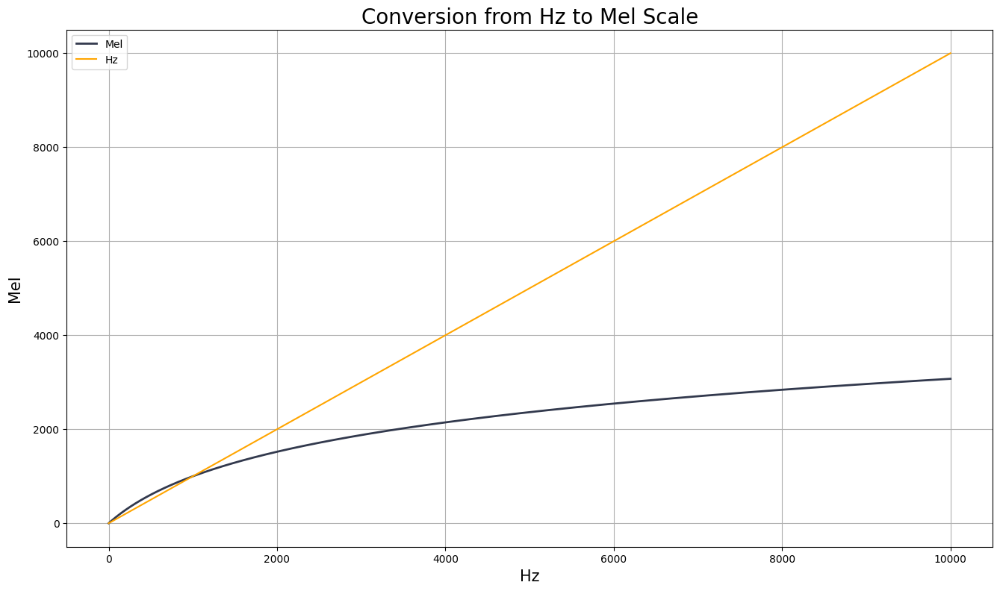

In [8]:
# Menghitung frekuensi dalam Hz
f = np.linspace(0, 10000, num=50100)

# Konversi frekuensi dalam Hz ke skala Mel
mel = 2595.0 * np.log10(1.0 + f / 700.0)

# Plot kurva konversi
plt.figure(figsize=(16, 9))
plt.plot(f, mel, color="#32394D", label='Mel', linewidth=2)
plt.plot(f, f, color="orange", label='Hz')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.legend()
plt.grid()
plt.xlabel("Hz", fontsize=15)
plt.ylabel("Mel", fontsize=15)
plt.title("Conversion from Hz to Mel Scale", fontsize=20)
plt.show()

Processing folder: blues


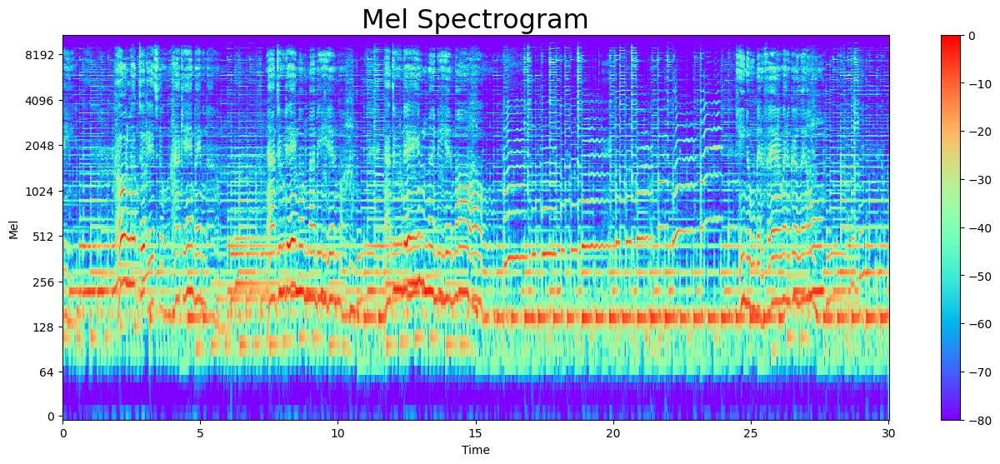

Processing folder: classical


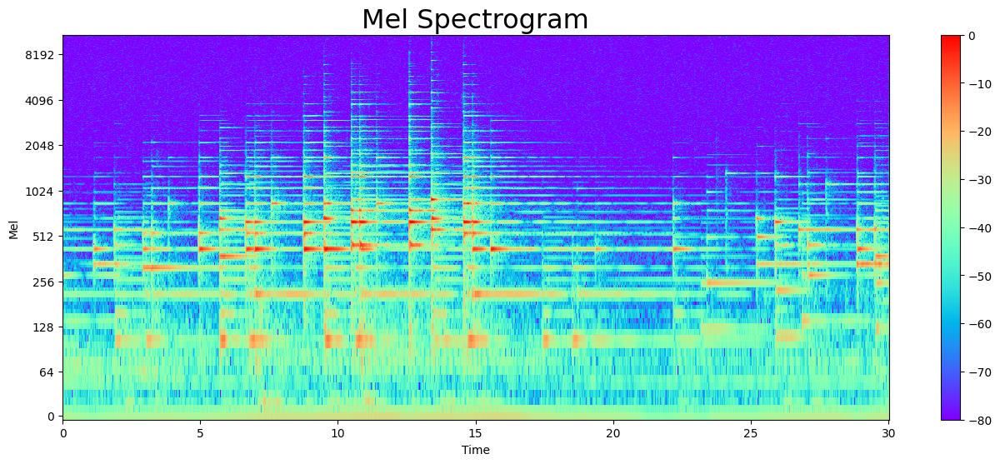

Processing folder: jazz


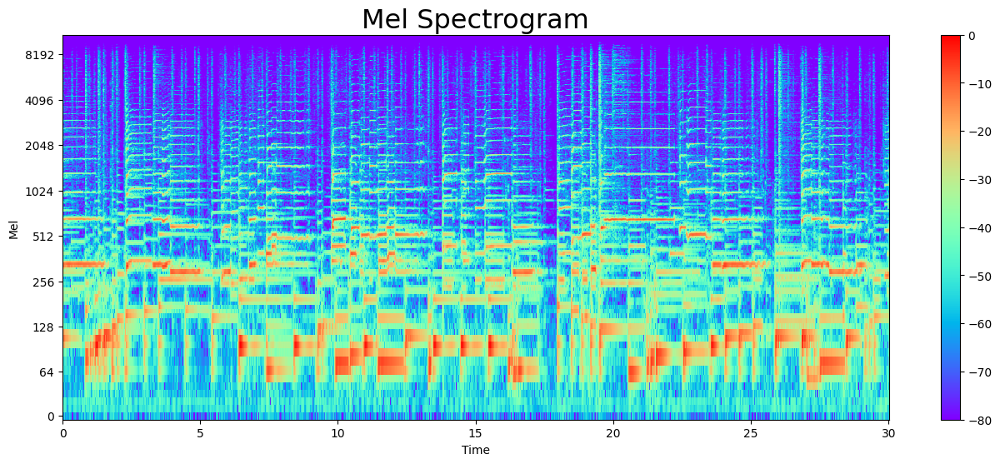

Processing folder: pop


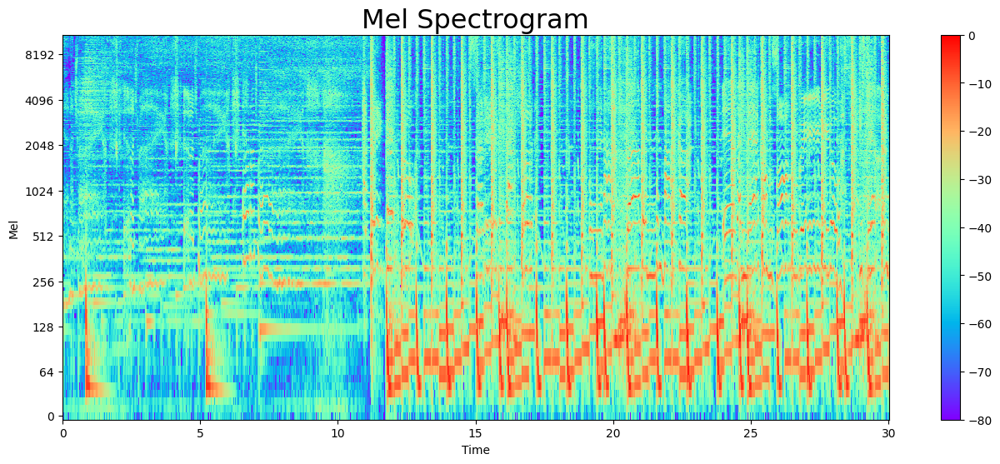

In [9]:
# Default FFT window size
n_fft = 2048  # Ukuran jendela FFT
hop_length = 512  # Jumlah frame audio antara kolom STFT (biasanya menjadi nilai default yang baik)

# Fungsi untuk memproses setiap folder di dalam direktori
def process_folders(directory):
    for folder in os.listdir(directory):
        folder_path = os.path.join(directory, folder)
        if os.path.isdir(folder_path):
            print(f"Processing folder: {folder}")
            # Mencari semua file audio dalam folder
            audio_files = [file for file in os.listdir(folder_path) if file.endswith('.wav')]
            if audio_files:
                # Memilih satu file audio secara acak
                audio_file = np.random.choice(audio_files)
                file_path = os.path.join(folder_path, audio_file)
                # Memuat file audio menggunakan librosa
                y, sr = librosa.load(file_path)
                # Menghitung Short-time Fourier Transform (STFT)
                D = np.abs(librosa.stft(y, n_fft=n_fft, hop_length=hop_length))
                # Konversi ke skala Desibel
                DB = librosa.amplitude_to_db(D, ref=np.max)
                # Menghitung frekuensi dalam Hz
                f = np.linspace(0, 10000, num=DB.shape[0])
                # Konversi frekuensi dalam Hz ke skala Mel
                mel = 2595.0 * np.log10(1.0 + f / 700.0)
                # Plot spektrogram
                plt.figure(figsize=(16, 6))
                librosa.display.specshow(DB, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', cmap='rainbow')
                plt.colorbar()
                plt.title("Mel Spectrogram", fontsize=23)
                plt.ylabel("Mel")
                plt.show()
                # Menghentikan setelah memproses satu file audio dari setiap genre
                #break

# Memanggil fungsi untuk memproses setiap folder
process_folders(general_path)

# Audio Feature

Processing folder: blues
Total zero crossings: 90452


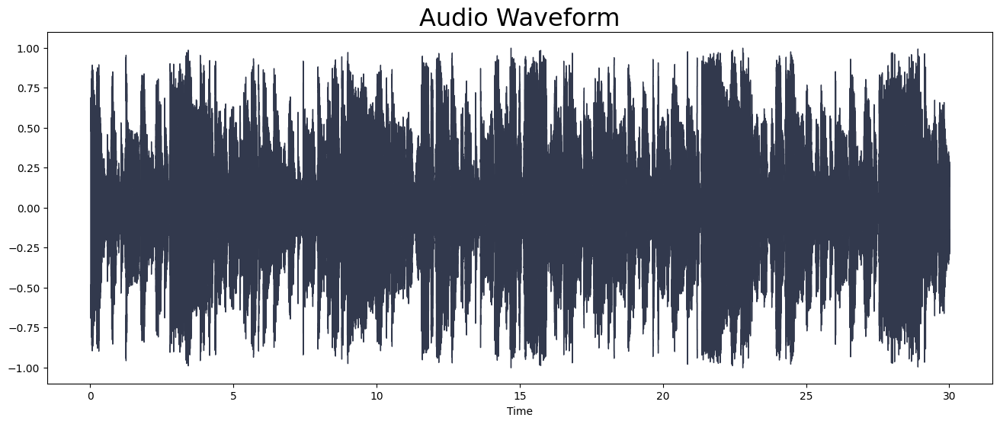

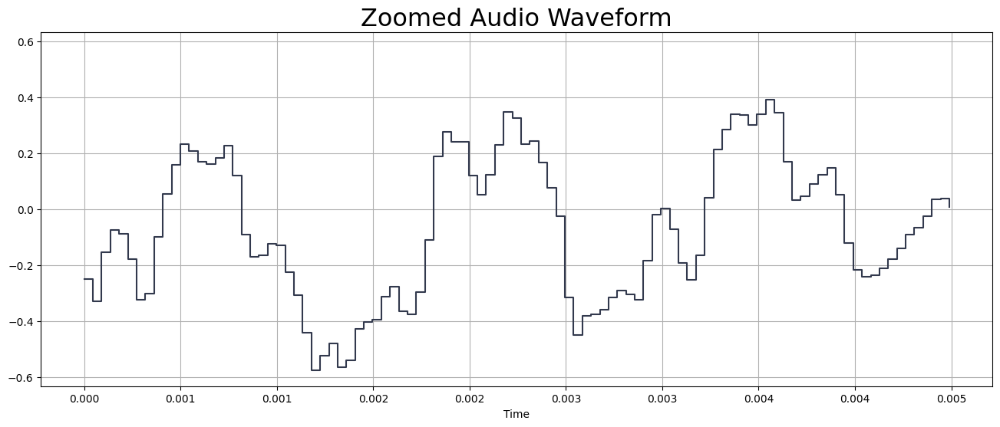

Total zero crossings in zoomed area: 9
Processing folder: classical
Total zero crossings: 39329


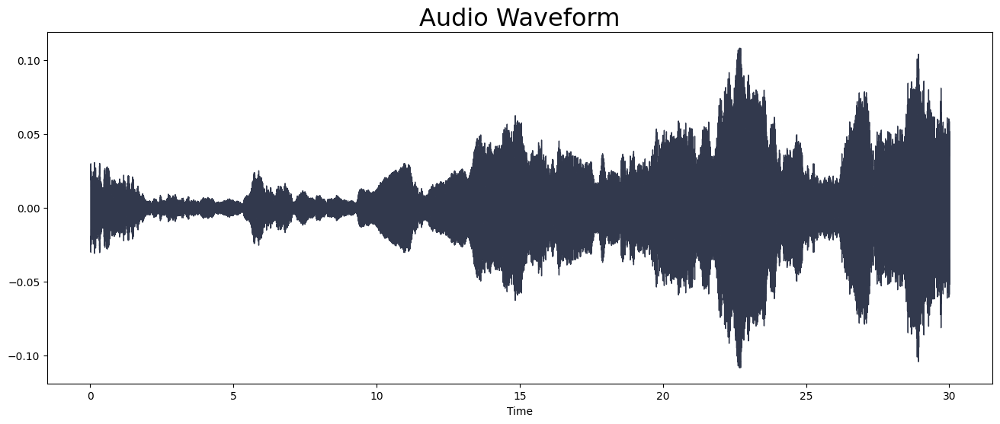

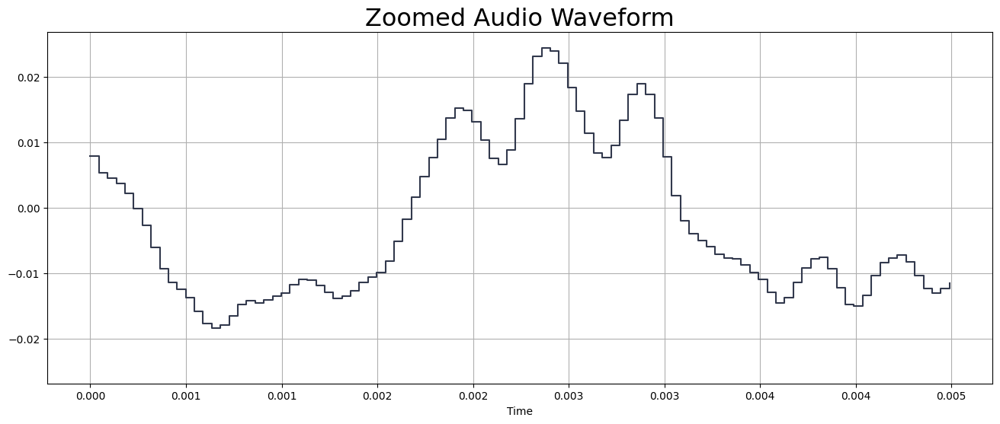

Total zero crossings in zoomed area: 3
Processing folder: jazz
Total zero crossings: 52711


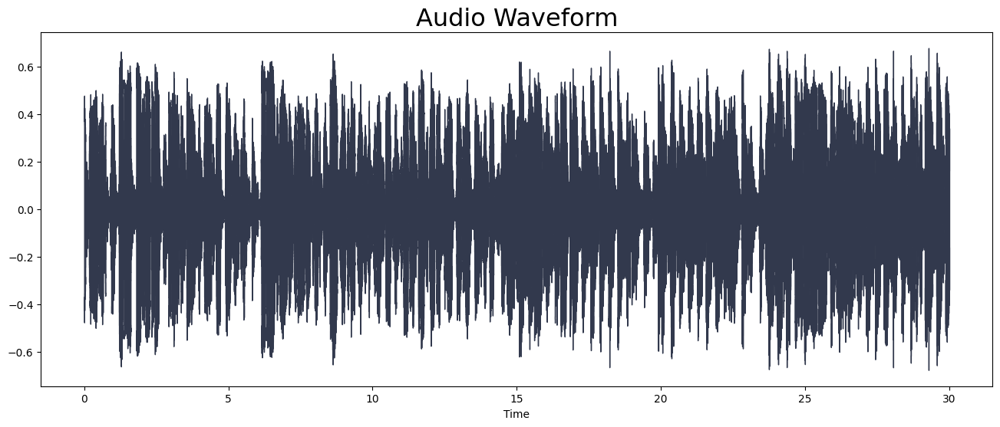

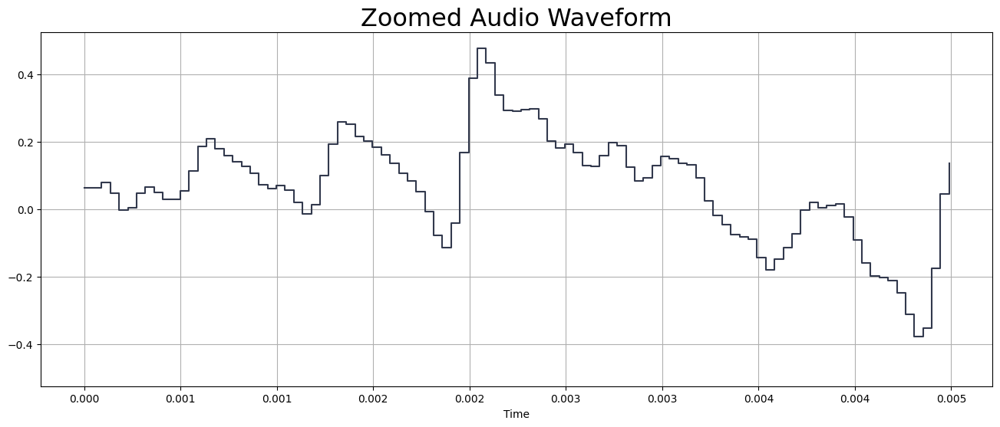

Total zero crossings in zoomed area: 10
Processing folder: pop
Total zero crossings: 96546


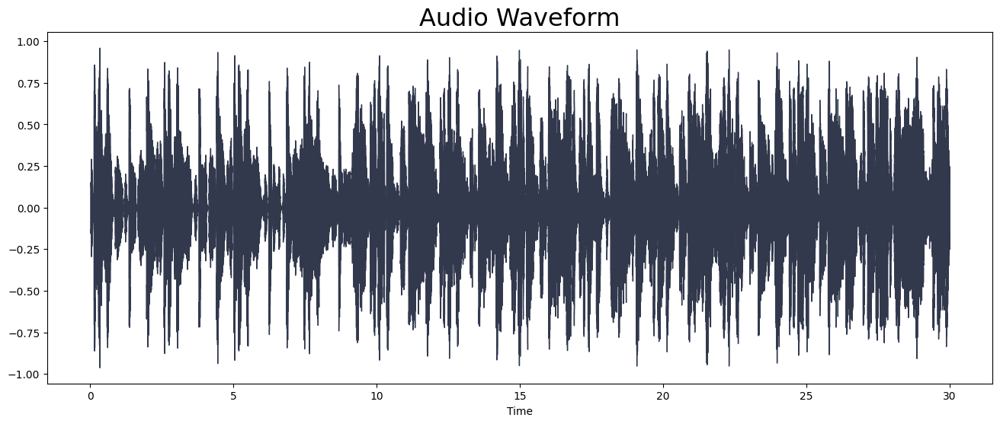

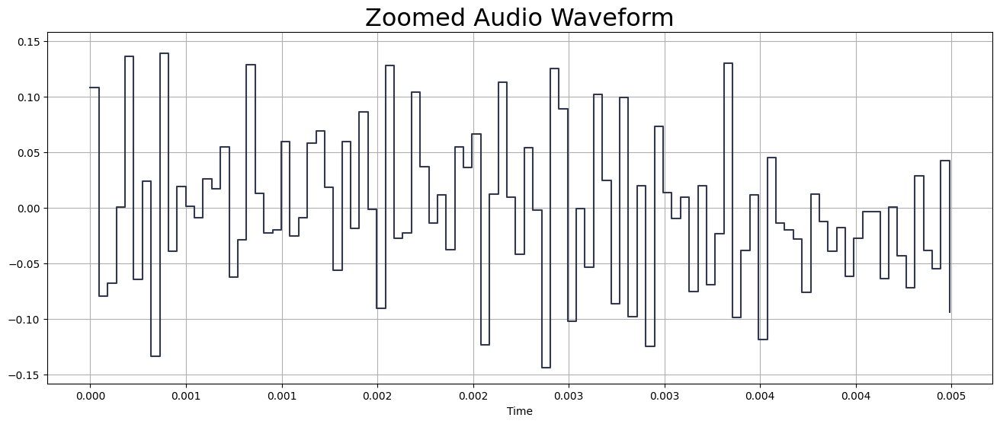

Total zero crossings in zoomed area: 61


In [10]:
# Fungsi untuk memproses setiap folder di dalam direktori
def process_folders(directory):
    for folder in os.listdir(directory):
        folder_path = os.path.join(directory, folder)
        if os.path.isdir(folder_path):
            print(f"Processing folder: {folder}")
            # Mencari semua file audio dalam folder
            audio_files = [file for file in os.listdir(folder_path) if file.endswith('.wav')]
            if audio_files:
                # Memilih satu file audio secara acak
                audio_file = np.random.choice(audio_files)
                file_path = os.path.join(folder_path, audio_file)
                # Memuat file audio menggunakan librosa
                y, sr = librosa.load(file_path)

                # Menghitung Zero Crossing Rate (ZCR) pada seluruh file audio
                zero_crossings_total = librosa.zero_crossings(y, pad=False)
                print("Total zero crossings:", sum(zero_crossings_total))

                # Memplot gelombang audio
                plt.figure(figsize=(16, 6))
                librosa.display.waveshow(y=y, sr=sr, color="#32394D")
                plt.title("Audio Waveform", fontsize=23)
                plt.show()

                # Memplot area tertentu dari gelombang audio untuk menghitung ZCR
                plt.figure(figsize=(16, 6))
                librosa.display.waveshow(y=y[0:100], sr=sr, color="#32394D")
                plt.title("Zoomed Audio Waveform", fontsize=23)
                plt.grid()
                plt.show()

                # Menghitung Zero Crossing Rate (ZCR) dari area tertentu gelombang audio
                zero_crossings_zoomed = librosa.zero_crossings(y[0:100], pad=False)
                print("Total zero crossings in zoomed area:", sum(zero_crossings_zoomed))

                # Menghentikan setelah memproses satu file audio dari setiap genre
                # break

# Memanggil fungsi untuk memproses setiap folder
process_folders(general_path)

Harmoni dan Perkursi

Processing folder: blues


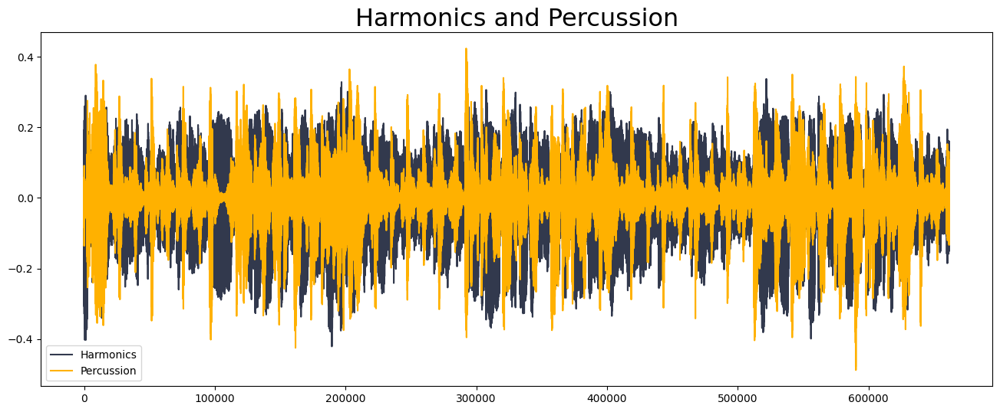

Processing folder: classical


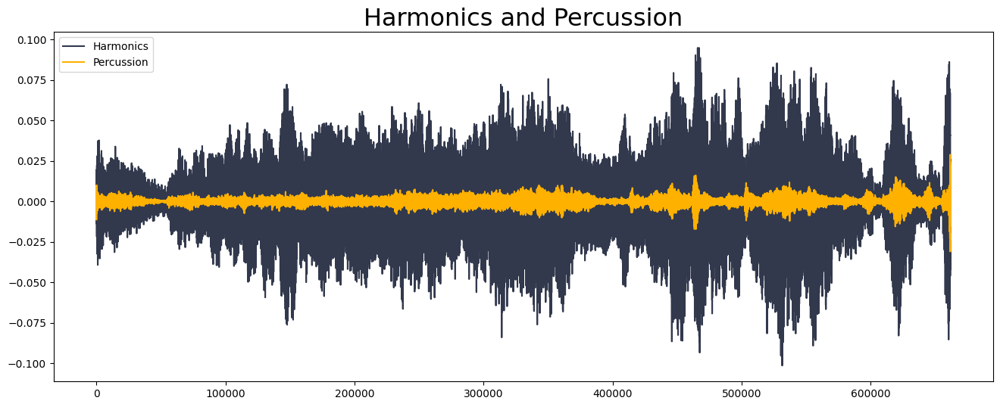

Processing folder: jazz


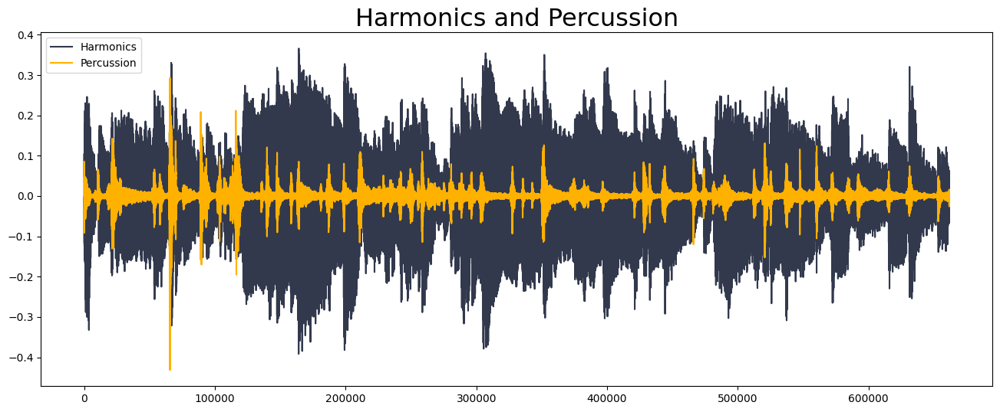

Processing folder: pop


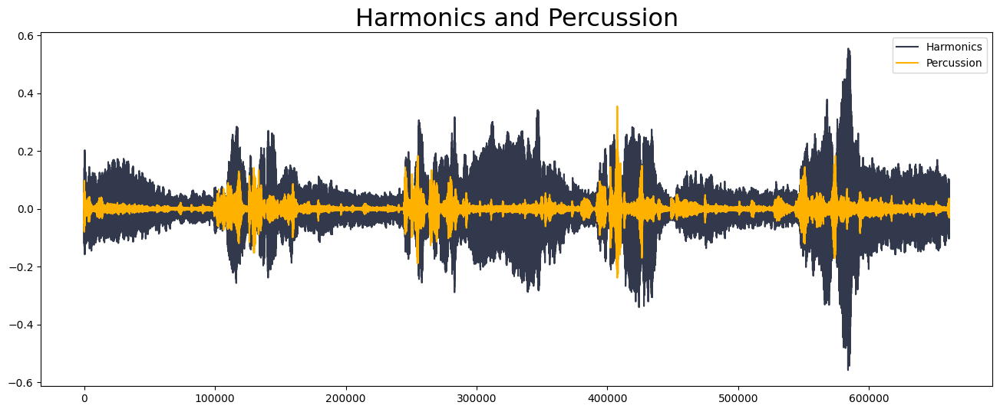

In [11]:
# Fungsi untuk memproses setiap folder di dalam direktori
def process_folders(directory):
    for folder in os.listdir(directory):
        folder_path = os.path.join(directory, folder)
        if os.path.isdir(folder_path):
            print(f"Processing folder: {folder}")
            # Mencari semua file audio dalam folder
            audio_files = [file for file in os.listdir(folder_path) if file.endswith('.wav')]
            if audio_files:
                # Memilih satu file audio secara acak
                audio_file = np.random.choice(audio_files)
                file_path = os.path.join(folder_path, audio_file)
                # Memuat file audio menggunakan librosa
                y, sr = librosa.load(file_path)

                # Memisahkan sinyal audio menjadi komponen harmonik dan perkusi
                y_harm, y_perc = librosa.effects.hpss(y)

                # Memplot kedua komponen
                plt.figure(figsize=(16, 6))
                plt.plot(y_harm, color='#32394D', label="Harmonics")
                plt.plot(y_perc, color='#FFB100', label="Percussion")
                plt.title("Harmonics and Percussion", fontsize=23)
                plt.legend()
                plt.show()

                # Menghentikan setelah memproses satu file audio dari setiap genre
                # break

# Memanggil fungsi untuk memproses setiap folder
process_folders(general_path)

# Proses Pelatihan

1. Ekstrasi Fitur

In [12]:
# Fungsi untuk memproses setiap folder di dalam direktori
def process_folders(directory):
    features = []
    labels = []
    for folder in os.listdir(directory):
        folder_path = os.path.join(directory, folder)
        if os.path.isdir(folder_path):
            print(f"Processing folder: {folder}")
            # Mencari semua file audio dalam folder
            audio_files = [file for file in os.listdir(folder_path) if file.endswith('.wav')]
            if audio_files:
                for audio_file in audio_files:
                    file_path = os.path.join(folder_path, audio_file)
                    # Memuat file audio menggunakan soundfile
                    y, sr = sf.read(file_path)
                    # Ekstraksi fitur MFCC
                    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
                    # Rata-rata MFCCs untuk setiap sampel audio
                    mfccs_mean = np.mean(mfccs, axis=1)
                    # Menyimpan fitur dan label
                    features.append(mfccs_mean)
                    labels.append(folder)
    return features, labels

# Ekstraksi fitur dan label
X, y = process_folders(general_path)

# Konversi ke array numpy
X = np.array(X)
y = np.array(y)

# Cetak dimensi matriks fitur dan label
print("Shape of feature matrix:", X.shape)
print("Shape of label array:", y.shape)

Processing folder: blues
Processing folder: classical
Processing folder: jazz
Processing folder: pop
Shape of feature matrix: (400, 13)
Shape of label array: (400,)


In [13]:
# Langkah 1: Ekstraksi fitur dan label dari data audio
features, labels = process_folders(directory_path)
# Langkah 2: Bagi data menjadi set pelatihan dan pengujian
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42)


# Kernel SVM dengan Grid Search untuk Penyetelan Parameter
svm = SVC()
param_grid = {'kernel': ['linear', 'rbf', 'poly'], 'C': [0.1, 1, 10], 'gamma': ['auto', 'scale']}
svm_grid = GridSearchCV(svm, param_grid, cv=5)
svm_grid.fit(X_train, y_train)
best_svm = svm_grid.best_estimator_

print("Best Parameters:", svm_grid.best_params_)

# Tampilkan performa pada setiap iterasi Grid Search
print("Grid Search Results:")
means = svm_grid.cv_results_['mean_test_score']
stds = svm_grid.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, svm_grid.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std * 2, params))

# Bagging SVM
bagging_svm = BaggingClassifier(base_estimator=best_svm, n_estimators=10, random_state=42)
bagging_svm.fit(X_train, y_train)

# Tampilkan akurasi pada setiap model dalam ensemble
print("\nBagging SVM Results:")
for idx, clf in enumerate(bagging_svm.estimators_):
    y_pred = clf.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    print("Model %d Accuracy: %.3f" % (idx+1, accuracy))

# Penanganan Data yang Tidak Seimbang dengan SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Latih SVM dengan data yang telah di-resample
svm_resampled = SVC(kernel='rbf', gamma='auto', C=1.0, random_state=42)
svm_resampled.fit(X_train_resampled, y_train_resampled)

# Cetak akurasi model SVM yang telah di-resample
y_pred_resampled = svm_resampled.predict(X_test)
accuracy_resampled = accuracy_score(y_test, y_pred_resampled)
print("\nResampled SVM Accuracy:", accuracy_resampled)

Processing folder: blues
Processing folder: classical
Processing folder: jazz
Processing folder: pop
Best Parameters: {'C': 0.1, 'gamma': 'auto', 'kernel': 'linear'}
Grid Search Results:
0.847 (+/-0.107) for {'C': 0.1, 'gamma': 'auto', 'kernel': 'linear'}
0.278 (+/-0.061) for {'C': 0.1, 'gamma': 'auto', 'kernel': 'rbf'}
0.819 (+/-0.076) for {'C': 0.1, 'gamma': 'auto', 'kernel': 'poly'}
0.847 (+/-0.107) for {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear'}
0.628 (+/-0.078) for {'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf'}
0.544 (+/-0.075) for {'C': 0.1, 'gamma': 'scale', 'kernel': 'poly'}
0.822 (+/-0.090) for {'C': 1, 'gamma': 'auto', 'kernel': 'linear'}
0.303 (+/-0.047) for {'C': 1, 'gamma': 'auto', 'kernel': 'rbf'}
0.819 (+/-0.076) for {'C': 1, 'gamma': 'auto', 'kernel': 'poly'}
0.822 (+/-0.090) for {'C': 1, 'gamma': 'scale', 'kernel': 'linear'}
0.750 (+/-0.148) for {'C': 1, 'gamma': 'scale', 'kernel': 'rbf'}
0.694 (+/-0.138) for {'C': 1, 'gamma': 'scale', 'kernel': 'poly'}
0.825 (+/-0

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(



Bagging SVM Results:
Model 1 Accuracy: 0.000
Model 2 Accuracy: 0.000
Model 3 Accuracy: 0.000
Model 4 Accuracy: 0.000
Model 5 Accuracy: 0.000
Model 6 Accuracy: 0.000
Model 7 Accuracy: 0.000
Model 8 Accuracy: 0.000
Model 9 Accuracy: 0.000
Model 10 Accuracy: 0.000

Resampled SVM Accuracy: 0.2875


In [14]:
# Membangun model SVM dengan kombinasi parameter terbaik
best_svm = SVC(kernel='poly', C=0.1, gamma='auto', random_state=42)

# Melatih model SVM dengan data pelatihan
best_svm.fit(X_train, y_train)

# Memprediksi label untuk set pengujian
y_pred = best_svm.predict(X_test)

# Menghitung akurasi model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# 5. Simpan model
joblib.dump(best_svm, 'music_genre_classification_model.pkl')

Accuracy: 0.825


['music_genre_classification_model.pkl']

In [15]:
print(best_svm)
X_train_np = np.array(X_train)
print("Tipe data fitur:", X_train_np.dtype)
print("Dimensi data fitur:", X_train_np.shape)

SVC(C=0.1, gamma='auto', kernel='poly', random_state=42)
Tipe data fitur: float64
Dimensi data fitur: (320, 13)


In [16]:
# Mencetak informasi hasil training
print("Support Vectors:\n", best_svm.support_vectors_)
print("Number of support vectors for each class:", best_svm.n_support_)
print("Dual coefficients:\n", best_svm.dual_coef_)

Support Vectors:
 [[-199.57513117  150.0861169     5.66340501 ...   -3.20002555
     6.0780811    -2.47844461]
 [-173.81046242  137.17354726  -23.72303023 ...   -1.96823976
     1.80117925   -3.00695023]
 [ -98.77109567  104.79962241  -35.09716775 ...   -5.37802686
    12.19764699   -9.95508263]
 ...
 [ -53.10433248   78.31420959    2.26183416 ...   -4.80214967
    -2.15153314    1.29349123]
 [-204.71895235  101.62682681   26.38164669 ...    6.22200093
    -9.48539439   -2.54501265]
 [ -50.85370351   68.05083784   12.07620706 ...    4.83250306
     1.69594919    2.72623296]]
Number of support vectors for each class: [30 24 39 15]
Dual coefficients:
 [[ 0.00000000e+00  3.72318014e-09  0.00000000e+00  0.00000000e+00
   1.38614973e-09  0.00000000e+00  0.00000000e+00  2.56807889e-09
   0.00000000e+00  0.00000000e+00  5.89714147e-10  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  5.86182231e-10
   0.00000000e+00  2.60086331e-10  0.00000000e+00  0.00000000e+00
   0.0000000

In [17]:
# Fungsi untuk menyesuaikan dimensi fitur
def adjust_feature_dimension(features, num_features_expected, num_frames_expected):
    # Jika jumlah fitur kurang dari yang diharapkan, tambahkan fitur tambahan dengan nilai default
    if features.shape[0] < num_features_expected:
        num_features_to_add = num_features_expected - features.shape[0]
        features = np.vstack((features, np.zeros((num_features_to_add, features.shape[1]))))
    # Jika jumlah fitur lebih dari yang diharapkan, potong fitur yang berlebihan
    elif features.shape[0] > num_features_expected:
        features = features[:num_features_expected, :]

    # Jika jumlah frame kurang dari yang diharapkan, tambahkan frame tambahan dengan nilai default
    if features.shape[1] < num_frames_expected:
        num_frames_to_add = num_frames_expected - features.shape[1]
        features = np.hstack((features, np.zeros((features.shape[0], num_frames_to_add))))
    # Jika jumlah frame lebih dari yang diharapkan, potong frame yang berlebihan
    elif features.shape[1] > num_frames_expected:
        features = features[:, :num_frames_expected]

    return features

# Upload file audio
uploaded = files.upload()

# Loop melalui file yang diunggah
for filename in uploaded.keys():
    # Baca file audio
    y, sr = librosa.load(filename, sr=None)

    # Ekstraksi fitur audio (misalnya, MFCC)
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)

    # Normalisasi fitur jika diperlukan
    mfccs_normalized = (mfccs - np.mean(mfccs)) / np.std(mfccs)

    # Menyesuaikan dimensi fitur agar sesuai dengan model yang digunakan
    num_features_expected = 13  # Ganti dengan jumlah fitur yang digunakan dalam data pelatihan
    num_frames_expected = 320  # Ganti dengan jumlah frame yang digunakan dalam data pelatihan
    mfccs_normalized = adjust_feature_dimension(mfccs_normalized, num_features_expected, num_frames_expected)

    # Load model SVM yang telah dilatih
    best_svm = joblib.load('music_genre_classification_model.pkl')

    # Lakukan prediksi genre musik
    predicted_genre = best_svm.predict(mfccs_normalized.T)  # Transpose mfccs_normalized agar dimensi sesuai

    # Cetak hasil prediksi
    print("Predicted genre for", filename, ":", predicted_genre[0])

Saving Jerry Kamit Lan E Sape Cover by Alif Fakod.mp3 to Jerry Kamit Lan E Sape Cover by Alif Fakod.mp3
Predicted genre for Jerry Kamit Lan E Sape Cover by Alif Fakod.mp3 : pop


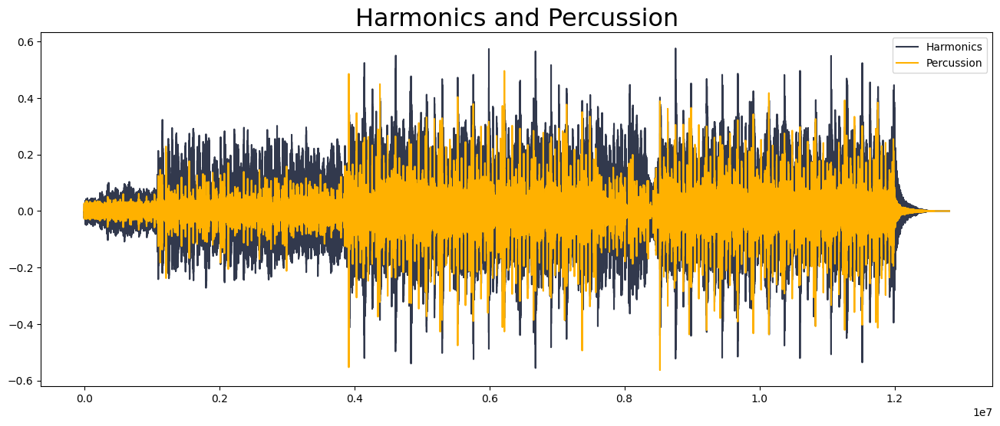

In [18]:
# Loop melalui file yang diunggah
for filename in uploaded.keys():
    # Baca file audio
    y, sr = librosa.load(filename, sr=None)

    # Pisahkan sinyal audio menjadi bagian harmonis dan bagian perkusi
    y_harmonic, y_percussive = librosa.effects.hpss(y)

    # Memplot kedua komponen
    plt.figure(figsize=(16, 6))
    plt.plot(y_harmonic, color='#32394D', label="Harmonics")
    plt.plot(y_percussive, color='#FFB100', label="Percussion")
    plt.title("Harmonics and Percussion", fontsize=23)
    plt.legend()
    plt.show()

In [19]:
def extract_image_features(image_paths):
    base_model = VGG16(weights='imagenet', include_top=False)
    model = Model(inputs=base_model.input, outputs=base_model.get_layer('block5_pool').output)

    features = []
    for img_path in image_paths:
        img = image.load_img(img_path, target_size=(224, 224))
        x = image.img_to_array(img)
        x = np.expand_dims(x, axis=0)
        x = preprocess_input(x)
        features.append(model.predict(x))

    return np.array(features)

def process_folders(directory):
    audio_features = []
    image_features = []
    labels = []

    for folder in os.listdir(directory):
        folder_path = os.path.join(directory, folder)
        if os.path.isdir(folder_path):
            print(f"Processing folder: {folder}")
            # Mencari semua file audio dalam folder
            audio_files = [file for file in os.listdir(folder_path) if file.endswith('.wav')]
            image_files = [file for file in os.listdir(folder_path) if file.endswith('.jpg') or file.endswith('.png')]

            if audio_files:
                for audio_file in audio_files:
                    file_path = os.path.join(folder_path, audio_file)
                    # Memuat file audio menggunakan soundfile
                    y, sr = librosa.load(file_path)
                    # Ekstraksi fitur MFCC
                    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
                    # Rata-rata MFCCs untuk setiap sampel audio
                    mfccs_mean = np.mean(mfccs, axis=1)
                    # Menyimpan fitur audio
                    audio_features.append(mfccs_mean)
                    # Menyimpan label
                    labels.append(folder)

            if image_files:
                image_paths = [os.path.join(folder_path, img_file) for img_file in image_files]
                # Ekstraksi fitur dari gambar-gambar menggunakan model VGG16
                folder_image_features = extract_image_features(image_paths)
                # Menambahkan fitur-fitur gambar ke dalam daftar fitur gambar
                image_features.extend(folder_image_features)

    return audio_features, image_features, labels



# Ekstraksi fitur dan label
audio_features, image_features, labels = process_folders(general_path)

# Konversi ke array numpy
audio_features = np.array(audio_features)
image_features = np.array(image_features)
labels = np.array(labels)

# Cetak dimensi matriks fitur dan label
print("Shape of audio feature matrix:", audio_features.shape)
print("Shape of image feature matrix:", image_features.shape)
print("Shape of label array:", labels.shape)


Processing folder: blues
Processing folder: classical
Processing folder: jazz
Processing folder: pop
Shape of audio feature matrix: (400, 13)
Shape of image feature matrix: (0,)
Shape of label array: (400,)


In [20]:
# Definisi path direktori
image_directory = '/content/drive/My Drive/dataset/AudioDataset/Data/images_original'

# Membuat daftar path file gambar dan label
image_paths = []
labels = []

for folder in os.listdir(image_directory):
    folder_path = os.path.join(image_directory, folder)
    if os.path.isdir(folder_path):
        for image_file in os.listdir(folder_path):
            if image_file.endswith('.png'):
                image_path = os.path.join(folder_path, image_file)
                image_paths.append(image_path)
                labels.append(folder)

# Konversi label ke bentuk numerik
label_encoder = LabelEncoder()
labels = label_encoder.fit_transform(labels)

# Mengubah label menjadi one-hot encoding
labels = to_categorical(labels)

# Memisahkan data menjadi set pelatihan dan pengujian
X_train, X_test, y_train, y_test = train_test_split(image_paths, labels, test_size=0.2, random_state=42)

# Memuat dan mengubah gambar menjadi array numpy
def load_images(image_paths):
    images = []
    for image_path in image_paths:
        image = load_img(image_path, target_size=(224, 224))
        image = img_to_array(image)
        images.append(image)
    return np.array(images)

X_train = load_images(X_train)
X_test = load_images(X_test)

# Normalisasi data
X_train = X_train / 255.0
X_test = X_test / 255.0

# Membangun model CNN sederhana
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(10, activation='softmax')  # 10 kelas genre musik
])

# Kompilasi model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Pelatihan model
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

# Evaluasi model
loss, accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", accuracy)

Epoch 1/10
25/25 [==============================] - 10s 154ms/step - loss: 2.4102 - accuracy: 0.1514 - val_loss: 2.1181 - val_accuracy: 0.3000
Epoch 2/10
25/25 [==============================] - 1s 54ms/step - loss: 1.9841 - accuracy: 0.2866 - val_loss: 1.8395 - val_accuracy: 0.3300
Epoch 3/10
25/25 [==============================] - 1s 59ms/step - loss: 1.5492 - accuracy: 0.4656 - val_loss: 1.6431 - val_accuracy: 0.4450
Epoch 4/10
25/25 [==============================] - 2s 62ms/step - loss: 1.2469 - accuracy: 0.5594 - val_loss: 1.5152 - val_accuracy: 0.5100
Epoch 5/10
25/25 [==============================] - 1s 56ms/step - loss: 0.8734 - accuracy: 0.7096 - val_loss: 1.6299 - val_accuracy: 0.5000
Epoch 6/10
25/25 [==============================] - 1s 54ms/step - loss: 0.5726 - accuracy: 0.8123 - val_loss: 1.5838 - val_accuracy: 0.5250
Epoch 7/10
25/25 [==============================] - 1s 55ms/step - loss: 0.3961 - accuracy: 0.8673 - val_loss: 1.5778 - val_accuracy: 0.5750
Epoch 8/10
